In [1]:
%run /eos/user/h/harafiqu/SWAN_projects/PS/Tools/Standard_Functions_PS.ipynb

Version 0.03. This is the latest version.
Please help me to improve it reporting bugs to guido.sterbini@cern.ch.
Your platform is Linux-3.10.0-957.10.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
Your folder is /eos/home-h/harafiqu/SWAN_projects/PS/Simulations/V_Scan
Your IP is 172.17.0.16
2019-04-26 16:12:56


In [2]:
import matplotlib.gridspec as gridspec
from math import log10, floor
import matplotlib.cm as cm
import scipy.io as sio 
import numpy as np
import glob

# Read filename, import data
def particles_from_matfile(filename):
    d = dict()
    sio.loadmat(filename, mdict=d)
    return d

# round to n significant figures
def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)


# Import MD data

In [3]:
df0 = pnd.read_pickle('MD4224_HighBrightness_Vertical')

In [4]:
df0

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,Qx,Qy,intensity,losses,ratio,emittance V,betx,bety,dx,emittance V 2ndMoment
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.208899,0.239078,7.548161e+11,1.698342,0.983017,0.907395,12.290697,22.402362,2.420438,1.086129
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.208694,0.229331,7.327544e+11,2.203742,0.977963,0.970381,12.224888,22.461964,2.446142,1.032262
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.208412,0.219715,6.951734e+11,2.985061,0.970149,0.830710,12.153851,22.522122,2.472855,0.911121
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,0.208581,0.209510,7.361018e+11,3.982576,0.960174,1.050453,12.076901,22.582841,2.500721,1.019498
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.208356,0.199719,7.079539e+11,2.690493,0.973095,1.009634,11.993226,22.644124,2.529907,1.070279
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,0.208183,0.189839,7.265163e+11,1.429472,0.985705,1.083705,11.901864,22.705976,2.560608,1.172736
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,0.208225,0.179881,7.214954e+11,0.909661,0.990903,1.093582,11.801652,22.768396,2.593051,1.143092
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,0.208439,0.170431,7.035416e+11,1.409083,0.985909,1.206908,11.691180,22.831385,2.627507,1.153305
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,0.208975,0.160332,7.135835e+11,1.263647,0.987364,1.262253,11.568714,22.894938,2.664296,1.318672
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.7317135567106865,0.017619,4.170178518144004,0.6838646886356207,"[22.31613531136438, 22.17913531136438, 21.9911...",...,0.208829,0.150752,7.117577e+11,1.797561,0.982024,1.370471,11.432101,22.959047,2.703798,1.278028


In [5]:
# One colour per data point
colors = cm.rainbow(np.linspace(0, 1, len(df0)))

# Import Simulation data

In [6]:
# Read .mat files into a dictionary

matfiles = glob.glob("23_Apr/*.mat")
sims = dict()

for f in matfiles:
    first = f.split('/')[1]
    second = first.split('.')[0]
    sims[str(second)] = f
    
sims

{'610_2p5_c172': '23_Apr/610_2p5_c172.mat',
 '610_2p5_c175': '23_Apr/610_2p5_c175.mat',
 '610_SbS_c172': '23_Apr/610_SbS_c172.mat',
 '610_nLK_c172': '23_Apr/610_nLK_c172.mat',
 '610_nLK_c175': '23_Apr/610_nLK_c175.mat',
 '612_2p5_c172': '23_Apr/612_2p5_c172.mat',
 '612_2p5_c175': '23_Apr/612_2p5_c175.mat',
 '612_SbS_c172': '23_Apr/612_SbS_c172.mat',
 '612_SbS_c175': '23_Apr/612_SbS_c175.mat',
 '612_nLK_c172': '23_Apr/612_nLK_c172.mat',
 '612_nLK_c175': '23_Apr/612_nLK_c175.mat',
 '614_2p5_c172': '23_Apr/614_2p5_c172.mat',
 '614_2p5_c175': '23_Apr/614_2p5_c175.mat',
 '614_SbS_c172': '23_Apr/614_SbS_c172.mat',
 '614_nLK_c172': '23_Apr/614_nLK_c172.mat',
 '614_nLK_c175': '23_Apr/614_nLK_c175.mat',
 '616_2p5_c172': '23_Apr/616_2p5_c172.mat',
 '616_2p5_c175': '23_Apr/616_2p5_c175.mat',
 '616_SbS_c172': '23_Apr/616_SbS_c172.mat',
 '616_SbS_c175': '23_Apr/616_SbS_c175.mat',
 '616_nLK_c172': '23_Apr/616_nLK_c172.mat',
 '616_nLK_c175': '23_Apr/616_nLK_c175.mat',
 '618_2p5_c172': '23_Apr/618_2p5

# Dictionary of tune points

In [7]:
# These are our tune points:
scan_points = np.linspace(610, 624, 15);
scan_points = scan_points/100;

Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
print Qy_points

[6.1, 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2, 6.21, 6.22, 6.23, 6.24]


In [8]:
# Make dictionary of nearest tune point and iterators
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

Tune points separated by +/-  0.005


{6.1: array([ 13,  28,  42,  57,  72,  99, 114, 129, 144, 159, 173, 186, 201,
        214, 228, 243, 258, 272, 286, 300, 314, 329, 343, 356, 371, 384,
        397, 410]),
 6.11: array([ 12,  27,  41,  56,  71,  86,  98, 113, 128, 143, 158, 172, 200,
        227, 242, 257, 271, 285, 299, 313, 328, 342, 370, 383, 396, 409]),
 6.12: array([ 26,  55,  70,  85, 112, 127, 142, 157, 171, 185, 199, 213, 226,
        241, 256, 270, 284, 298, 312, 327, 341, 369, 382, 408]),
 6.13: array([ 11,  25,  40,  54,  69,  84,  97, 111, 126, 141, 156, 170, 184,
        198, 212, 225, 240, 255, 269, 283, 297, 311, 326, 340, 355, 368,
        381, 395, 407]),
 6.14: array([ 10,  24,  39,  53,  68,  83,  96, 110, 125, 140, 155, 169, 183,
        197, 211, 224, 239, 254, 268, 296, 310, 325, 339, 354, 367, 380,
        406]),
 6.15: array([  9,  23,  38,  52,  67,  82,  95, 109, 124, 139, 154, 182, 196,
        210, 223, 238, 253, 267, 282, 295, 309, 324, 338, 353, 366, 379,
        394]),
 6.16: array([  8,  

# Function to find peak

In [27]:
def peakfinder (x_dat, y_dat, tolerance = 1, verbose=False):
    
    # Find maximum
    max_y = max(y_dat)
    if verbose: print '\n\tMAX(y_dat) = ', max_y   
    
    # Assume peak as centre
    index = np.where(y_dat == max_y)[0][0]

    # Check if centre is near 0.0
    if abs(x_dat[index]) < tolerance:
        if verbose: print '\tx_dat[index] = ', x_dat[index]
    
    # Manually find 0 index
    else:
        if verbose: print '\tindex from y_dat peak not within tolerance of',tolerance,'mm. \n\ttry manual search'
        
        index = -1
        final_index = -1
        for i in xrange(len(x_dat)):
            index = index + 1
            if x_dat[i] < 0.0:
                final_index = index
                break
                
        index = final_index
        if verbose: print '\tindex = ', index       
       
    if verbose: print '\tindex of x_dat = ', x_dat[index],' is ', index
        
    # Take y=0 +/- 3 points and find mean 
    mean_dat = [y_dat[index-3],  y_dat[index-2],  y_dat[index-1], y_dat[index],  y_dat[index+1],  y_dat[index+2],  y_dat[index+3]]
    mean_7 = np.mean(mean_dat)
    if verbose: print '\tMean of peak point +/- 3 points = ', mean_7   
    
    if abs( abs(mean_7 - max_y) / mean_7 ) > 0.2:
        print '\tWARNING: difference between mean and max_y > 20% = ', abs( abs(mean_7 - max_y) / mean_7 )
        print '\t using peak value'
        mean_7 = max_y
    return mean_7

# Test Peakfinder

In [28]:
peak = peakfinder(np.array(df0['position V'].iloc[0]), np.array(df0['profile V'].iloc[0]),tolerance = 0.01, verbose=True)
print peak



	MAX(y_dat) =  0.6638534591783954
	index from y_dat peak not within tolerance of 0.01 mm. 
	try manual search
	index =  192
	index of x_dat =  -0.03379243863650805  is  192
	Mean of peak point +/- 3 points =  0.638239823191498
0.638239823191498


59.357650521392706


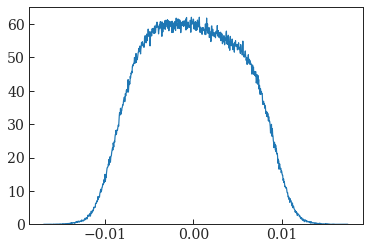

In [29]:
d = particles_from_matfile('23_Apr/610_2p5_c172.mat')
plt.clf()
x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x))
print peak

plt.plot(bins_[:-1], x)


max(y_dat) =  122.93846859139471
	 x_dat[index] =  -0.0006416434225729132
	zero index x value =  -0.0006416434225729132
	index of x_dat =  -0.0006416434225729132  is  457
	Mean of 0 point +/- 3 points =  119.96169815572418
119.96169815572418


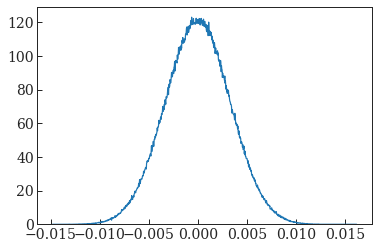

In [30]:
d = particles_from_matfile('23_Apr/624_nLK_c175.mat')
plt.clf()
x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')
    
peak = peakfinder_2(np.array(bins_[:-1]), np.array(x), verbose=True)
print peak

plt.plot(bins_[:-1], x)



max(y_dat) =  61.49440273113954
	 x_dat[index] =  0.0010871812122380184
	zero index x value =  0.0010871812122380184
	index of x_dat =  0.0010871812122380184  is  520
	Mean of 0 point +/- 3 points =  58.72358339173679
58.72358339173679


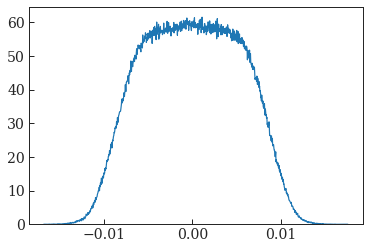

In [31]:

d = particles_from_matfile('23_Apr/610_2p5_c175.mat')
plt.clf()
x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')
    
peak = peakfinder_2(np.array(bins_[:-1]), np.array(x), verbose=True)
print peak

plt.plot(bins_[:-1], x)

# Check all simulation data peaks

In [32]:
for key, value in sorted(sims.iteritems()):
    print value
    d = particles_from_matfile(value)
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')

    peak = peakfinder_2(np.array(bins_[:-1]), np.array(x), verbose=True)
    print '\n peak = ', peak, '\n'
    plt.close()

23_Apr/610_2p5_c172.mat

max(y_dat) =  62.03248901609271
	 x_dat[index] =  0.0006644736430204135
	zero index x value =  0.0006644736430204135
	index of x_dat =  0.0006644736430204135  is  511
	Mean of 0 point +/- 3 points =  59.357650521392706

 peak =  59.357650521392706 

23_Apr/610_2p5_c175.mat

max(y_dat) =  61.49440273113954
	 x_dat[index] =  0.0010871812122380184
	zero index x value =  0.0010871812122380184
	index of x_dat =  0.0010871812122380184  is  520
	Mean of 0 point +/- 3 points =  58.72358339173679

 peak =  58.72358339173679 

23_Apr/610_SbS_c172.mat

max(y_dat) =  68.81981869235882
	 x_dat[index] =  -0.000434955730989315
	zero index x value =  -0.000434955730989315
	index of x_dat =  -0.000434955730989315  is  475
	Mean of 0 point +/- 3 points =  67.44222203627281

 peak =  67.44222203627281 

23_Apr/610_nLK_c172.mat

max(y_dat) =  68.27963846604806
	 x_dat[index] =  6.023263363791678e-05
	zero index x value =  6.023263363791678e-05
	index of x_dat =  6.023263363791678e


max(y_dat) =  125.62496191042332
	 x_dat[index] =  -2.6726388701613785e-05
	zero index x value =  -2.6726388701613785e-05
	index of x_dat =  -2.6726388701613785e-05  is  489
	Mean of 0 point +/- 3 points =  121.45183696191341

 peak =  121.45183696191341 

23_Apr/620_nLK_c175.mat

max(y_dat) =  123.40770745762002
	 x_dat[index] =  -8.73486989244436e-06
	zero index x value =  -8.73486989244436e-06
	index of x_dat =  -8.73486989244436e-06  is  499
	Mean of 0 point +/- 3 points =  120.49532333732145

 peak =  120.49532333732145 

23_Apr/622_2p5_c172.mat

max(y_dat) =  127.99495380500656
	 x_dat[index] =  2.059916506424314e-05
	zero index x value =  2.059916506424314e-05
	index of x_dat =  2.059916506424314e-05  is  500
	Mean of 0 point +/- 3 points =  123.86365575924336

 peak =  123.86365575924336 

23_Apr/622_2p5_c175.mat

max(y_dat) =  125.56036256596254
	 x_dat[index] =  2.4848409666121396e-05
	zero index x value =  2.4848409666121396e-05
	index of x_dat =  2.4848409666121396e-05  is

# Plot wirescanner profiles with simulation data

In [33]:
# Function to plot data:
# d = simulation matfile dictionary
# df = MD dataframe
# md_points = array of dataframe indexes

def Plot_profiles_MD_cf_Sims(d, df, md_points, main_label = '', bins=1000, sim_label='sim', md_label='MD'):
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    multi = 1/1E-3
    
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='k')
    
    for i in md_points:
        
        # Normalisation so all plots peak at y=1
        df_norm = 1/peakfinder(np.array(df0['position V'].iloc[i]), np.array(df0['profile V'].iloc[i]))
        sim_norm = 1/peakfinder(np.array(bins_[:-1]), np.array(x))
        
        lab = md_label + str(i)
        plt.plot(df0['position V'].iloc[i], np.array(df0['profile V'].iloc[i])*df_norm, color=colors[i], label = md_label, lw=0.5)
  
    bins_ = np.array(bins_[:-1]) + (abs(bins_[0]-bins_[1])/2)

    plt.plot(bins_, x*sim_norm, lw=2, color='k', label=sim_label)
    
    
    plt.ylabel('Arbitrary Unit')
    plt.xlabel('y [mm]')
    plt.legend(fontsize='x-small')
    plt.grid();
    plt.title(main_label)
    savename = main_label + '.png'
    fig.savefig(savename);


Importing simulation file: 622_2p5_c172
Qy =  6.22 , ctime = 172.0 [ms]
[2, 45, 132, 175, 217, 261, 303, 346, 387]

Importing simulation file: 624_nLK_c175
Qy =  6.24 , ctime = 175.0 [ms]
[14, 58, 100, 145, 187, 229, 273, 315, 357, 398]

Importing simulation file: 622_2p5_c175
Qy =  6.22 , ctime = 175.0 [ms]
[16, 60, 102, 147, 189, 231, 275, 317, 359, 400]

Importing simulation file: 614_2p5_c172
Qy =  6.14 , ctime = 172.0 [ms]
[10, 53, 96, 140, 183, 224, 268, 310, 354]

Importing simulation file: 618_2p5_c175
Qy =  6.18 , ctime = 175.0 [ms]
[20, 64, 106, 151, 193, 235, 279, 321, 363, 404]

Importing simulation file: 618_2p5_c172
Qy =  6.18 , ctime = 172.0 [ms]
[6, 49, 92, 136, 179, 220, 264, 306, 350, 391]

Importing simulation file: 614_2p5_c175
Qy =  6.14 , ctime = 175.0 [ms]
[24, 68, 110, 155, 197, 239, 325, 367, 406]

Importing simulation file: 612_SbS_c175
Qy =  6.12 , ctime = 175.0 [ms]
[26, 70, 112, 157, 199, 241, 284, 327, 369, 408]

Importing simulation file: 612_SbS_c172
Qy

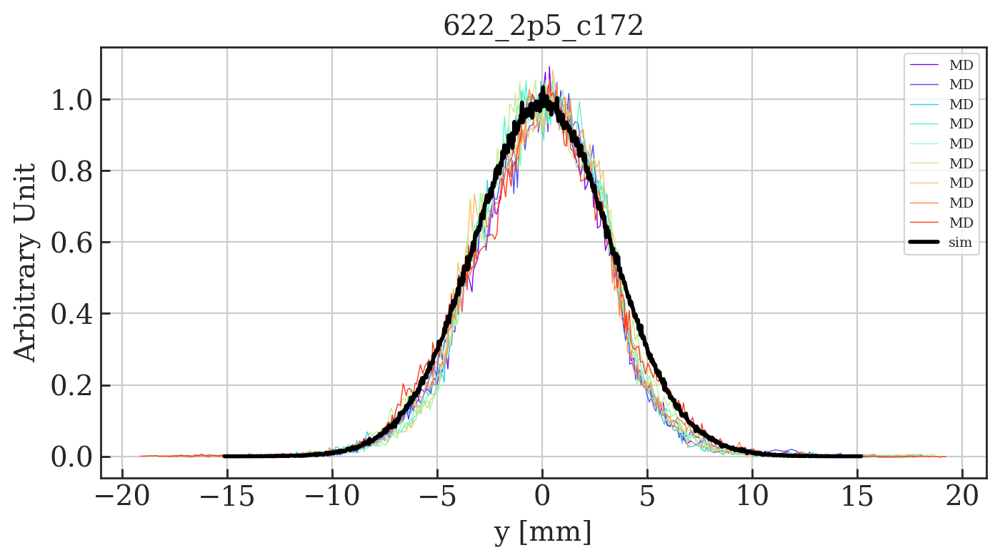

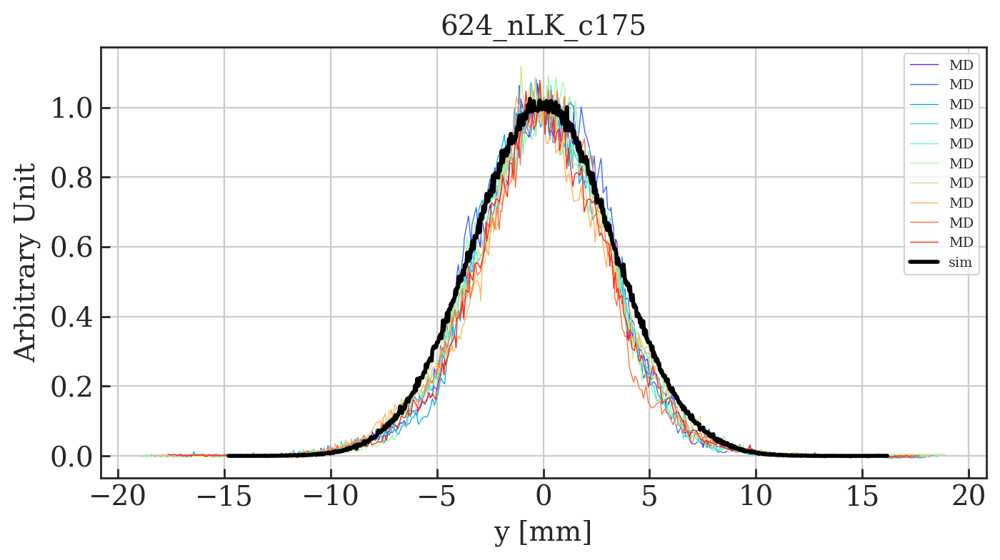

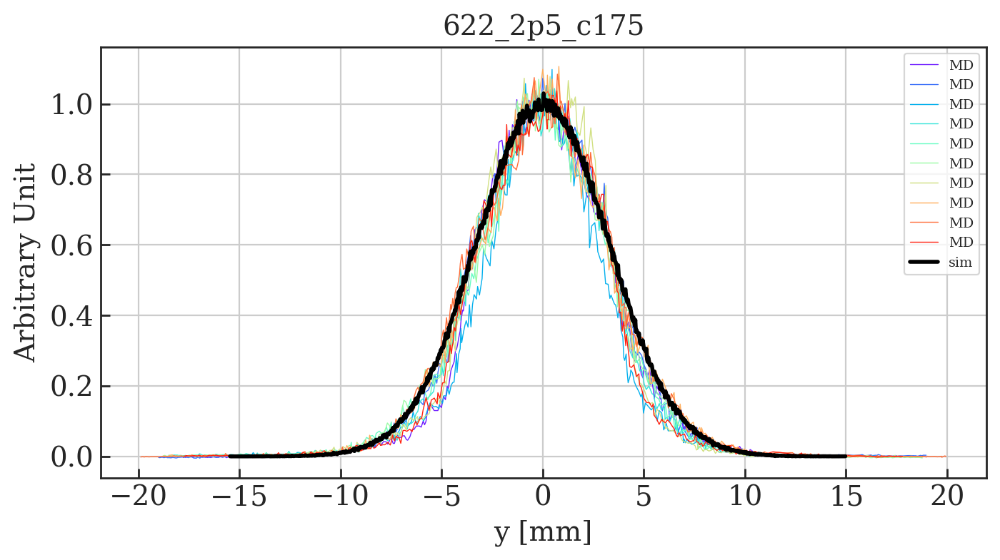

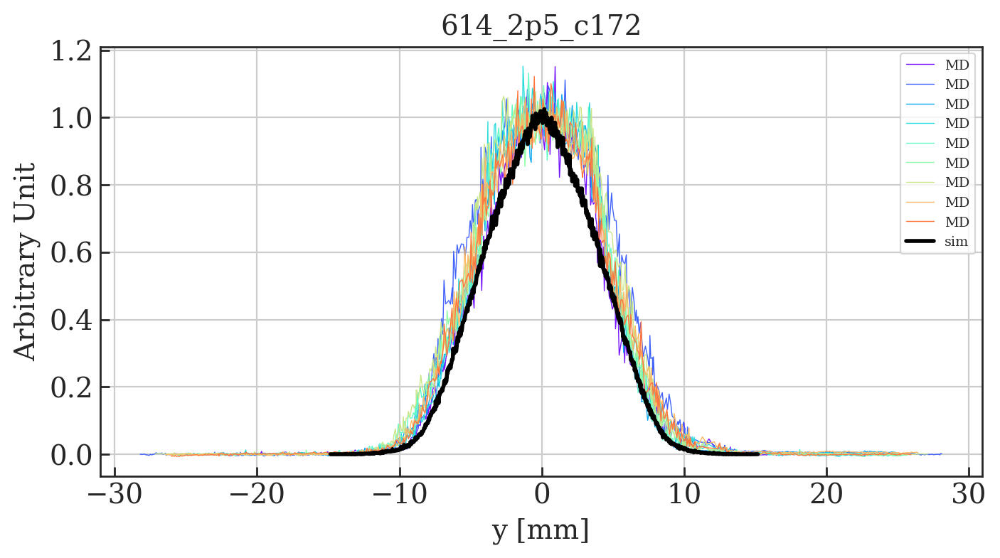

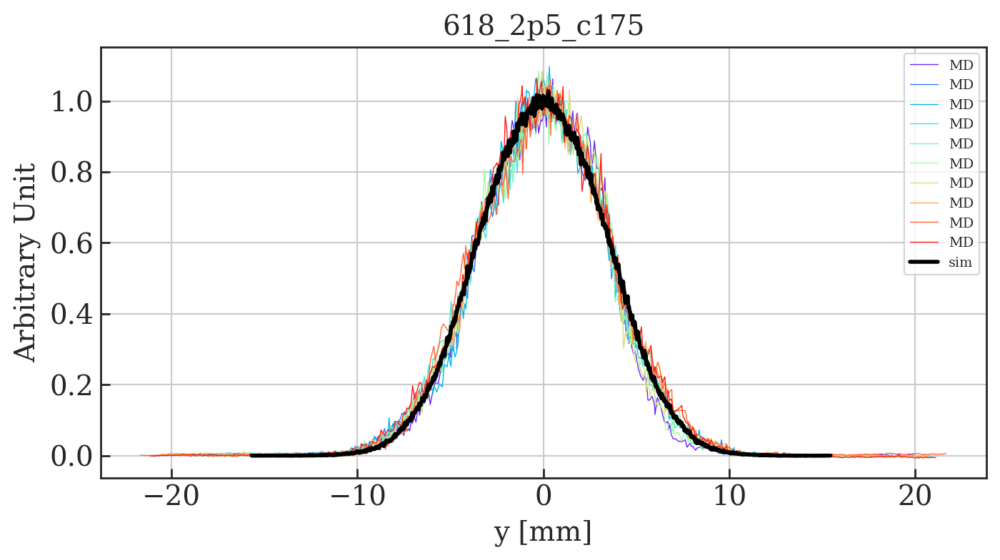

...

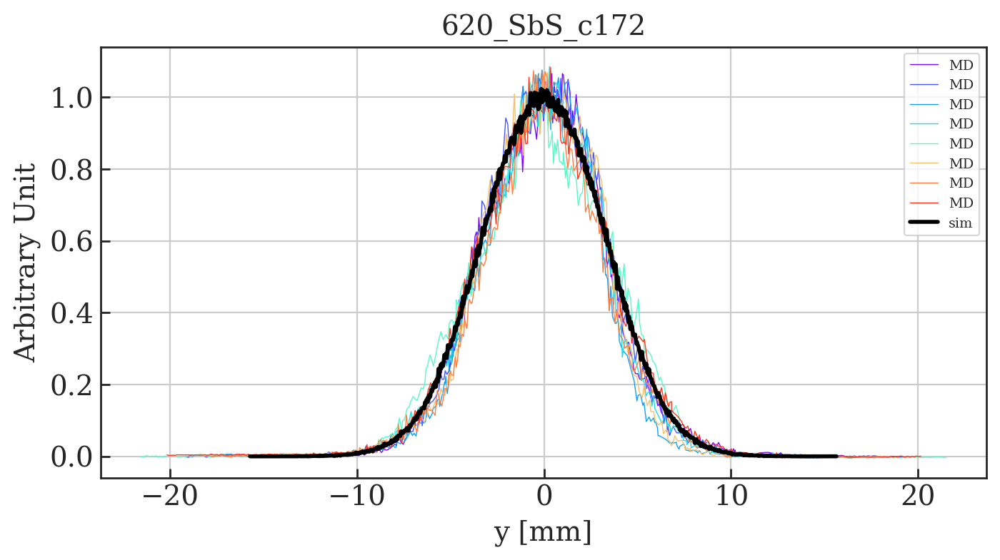

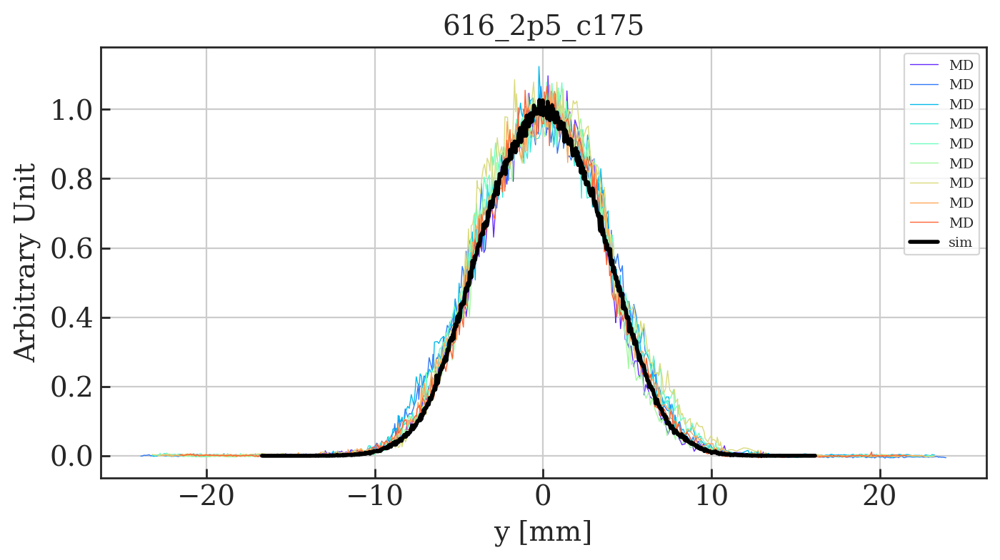

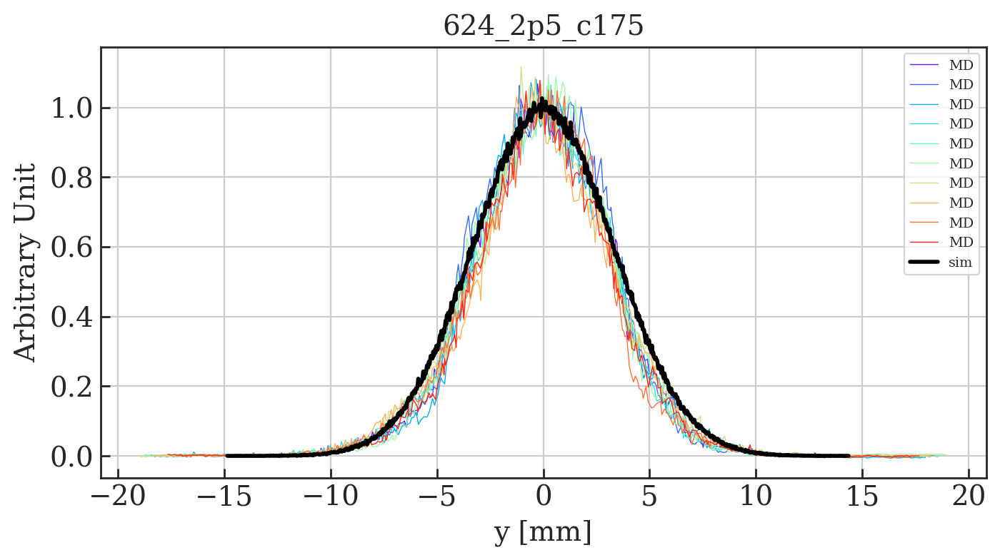

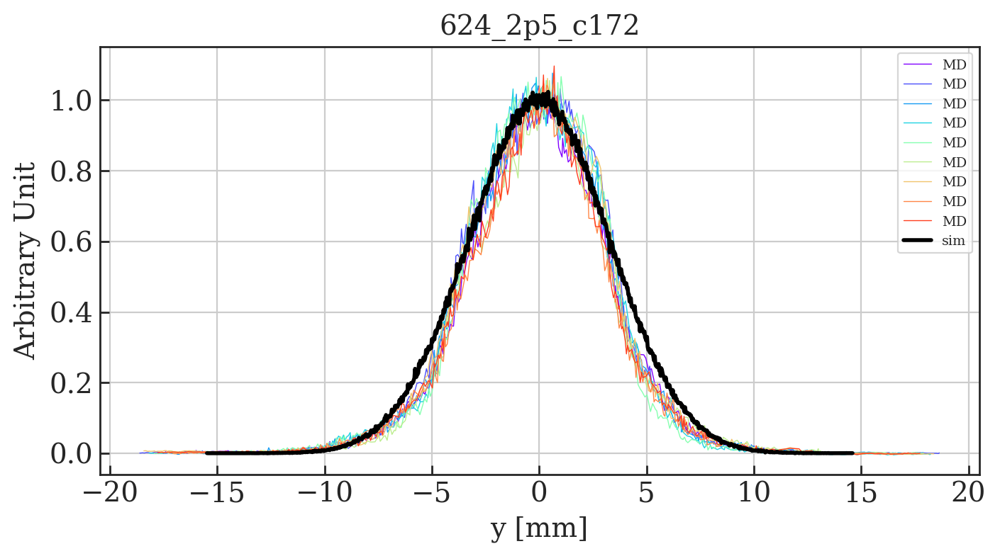

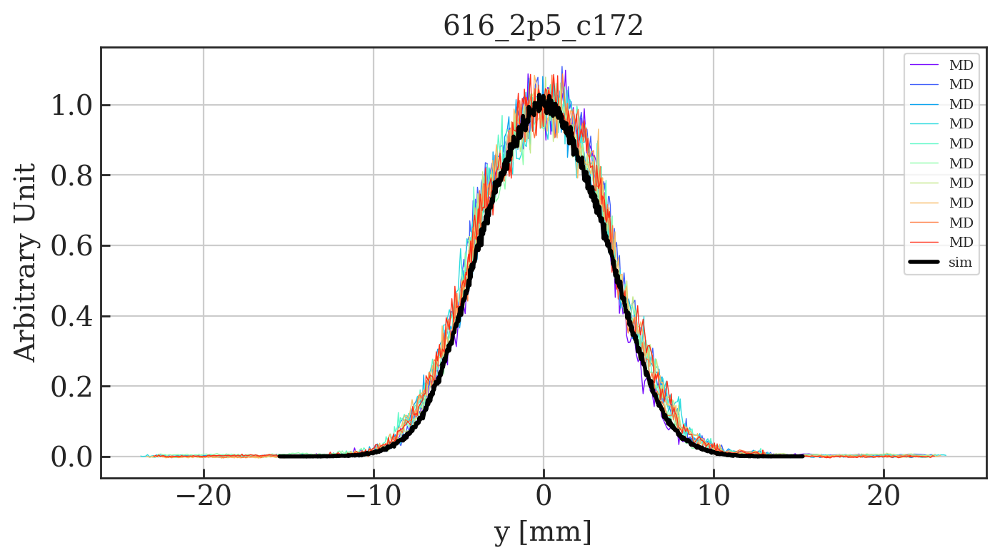

In [34]:
#Main function
verbose = True

for key, value in sorted(sims.iteritems()):
    if verbose: print '\nImporting simulation file:', key
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms]'
        
    d = particles_from_matfile(value)
        
    # Find MD data with same tune and ctime
    
    md_points = []
    for i in tune_points[tune_y]:
        if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
            md_points.append(i)
            
    if verbose: print md_points
        
    # Plot data
    main_label = key
    Plot_profiles_MD_cf_Sims(d, df0, md_points, main_label)  

In [35]:
def Plot_profiles_cf_sc_models(df, md_points, d1, d2=None, d3=None, main_label = '', bins=1000, sim_labels=None, md_label='MD', plot_md=False):
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    multi = 1/1E-3
    
    if sim_labels is None:
        if d2 is not None:
            sim_labels = ['2.5D','nLK']
        elif d3 is not None:
            sim_labels = ['2.5D','nLK','SbS']            
        else:
            sim_labels = ['2.5D']
    
    plt.clf()
    x1, bins_1, p1 = plt.hist(d1['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='k')
    
    if d2 is not None:
        plt.clf()
        x2, bins_2, p2 = plt.hist(d2['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='r')
        
        if d3 is not None:
            plt.clf()
            x3, bins_3, p3 = plt.hist(d3['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='b')
   
        
    norm1 = 1/peakfinder(np.array(bins_1[:-1]), np.array(x1), verbose=True)
    if d2 is not None: norm2 = 1/peakfinder(np.array(bins_2[:-1]), np.array(x2), verbose=True)
    if d3 is not None: norm3 = 1/peakfinder(np.array(bins_3[:-1]), np.array(x3), verbose=True)
        
    if plot_md:
        for i in md_points:
            # Normalisation so all plots peak at y=1
            multi2 = 1/peakfinder(np.array(df0['position V'].iloc[i]), np.array(df0['profile V'].iloc[i]))
#             multi2 = 1/max(np.array(df0['profile V'].iloc[i]))

            lab = md_label + str(i)
            plt.plot(df0['position V'].iloc[i], np.array(df0['profile V'].iloc[i])*multi2, color=colors[i], label = md_label, lw=0.5)

    bins1 = np.array(bins_1[:-1]) + (abs(bins_1[0]-bins_1[1])/2)
    plt.plot(bins1, x1*norm1, lw=2, color='k', label=sim_labels[0])
    if d2 is not None: 
        bins2 = np.array(bins_2[:-1]) + (abs(bins_2[0]-bins_2[1])/2)
        plt.plot(bins2, x2*norm2, lw=2, color='r', label=sim_labels[1])
    if d3 is not None: 
        bins3 = np.array(bins_3[:-1]) + (abs(bins_3[0]-bins_3[1])/2)
        plt.plot(bins3, x3*norm3, lw=2, color='b', label=sim_labels[2])
    
    
    plt.xlim(-20, 20)
    plt.ylim(-0.05, 1.1)
    
    plt.ylabel('Arbitrary Unit')
    plt.xlabel('y [mm]')
    plt.legend(fontsize='x-small')
    plt.grid();
    plt.title(main_label)
    savename = main_label + '.png'
    fig.savefig(savename);
    

# Compare SC Models only


Importing simulation file: 610_2p5_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  2p5
	MATCH FOUND
	Qy =  6.1 , ctime = 172.0 [ms]
	lab =  2p5 , lab1 = SbS
	MATCH FOUND
	Qy =  6.1 , ctime = 172.0 [ms]
	lab =  2p5 , lab1 = nLK
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.0620324890160946
	x_dat[index] =  0.6644736430204148
	index of x_dat =  0.6644736430204148  is  511
	Mean of peak point +/- 3 points =  0.059357650521392843

	MAX(y_dat) =  0.06881981869235444
	x_dat[index] =  -0.4349557309893157
	index of x_dat =  -0.4349557309893157  is  475
	Mean of peak point +/- 3 points =  0.06744222203627334

	MAX(y_dat) =  0.0682796384660435
	x_dat[index] =  0.06023263363791642
	index of x_dat =  0.06023263363791642  is  503
	Mean of peak point +/- 3 points =  0.0664914519889055

Importing simulation file: 610_2p5_c175
Qy =  6.1 , ctime = 175.0 [ms], label =  2p5
	MATCH FOUND
	Qy =  6.1 , ctime = 175.0 [ms]
	lab =  2p5 , lab1 = nLK
[28, 72, 114, 159, 201, 243, 286, 329, 371,


	MAX(y_dat) =  0.12282843531777879
	x_dat[index] =  0.016090629062309958
	index of x_dat =  0.016090629062309958  is  488
	Mean of peak point +/- 3 points =  0.12047365393568162

	MAX(y_dat) =  0.1239215625220683
	x_dat[index] =  -0.5065212192052684
	index of x_dat =  -0.5065212192052684  is  490
	Mean of peak point +/- 3 points =  0.12065600672662538

	MAX(y_dat) =  0.12340770745762977
	x_dat[index] =  -0.008734869892442987
	index of x_dat =  -0.008734869892442987  is  499
	Mean of peak point +/- 3 points =  0.12049532333732134

Importing simulation file: 622_2p5_c172
Qy =  6.22 , ctime = 172.0 [ms], label =  2p5
	MATCH FOUND
	Qy =  6.22 , ctime = 172.0 [ms]
	lab =  2p5 , lab1 = nLK
[2, 45, 132, 175, 217, 261, 303, 346, 387]

	MAX(y_dat) =  0.12799495380500345
	x_dat[index] =  0.020599165064243863
	index of x_dat =  0.020599165064243863  is  500
	Mean of peak point +/- 3 points =  0.1238636557592434

	MAX(y_dat) =  0.12766857993880312
	x_dat[index] =  0.16368371379296498
	index of x_

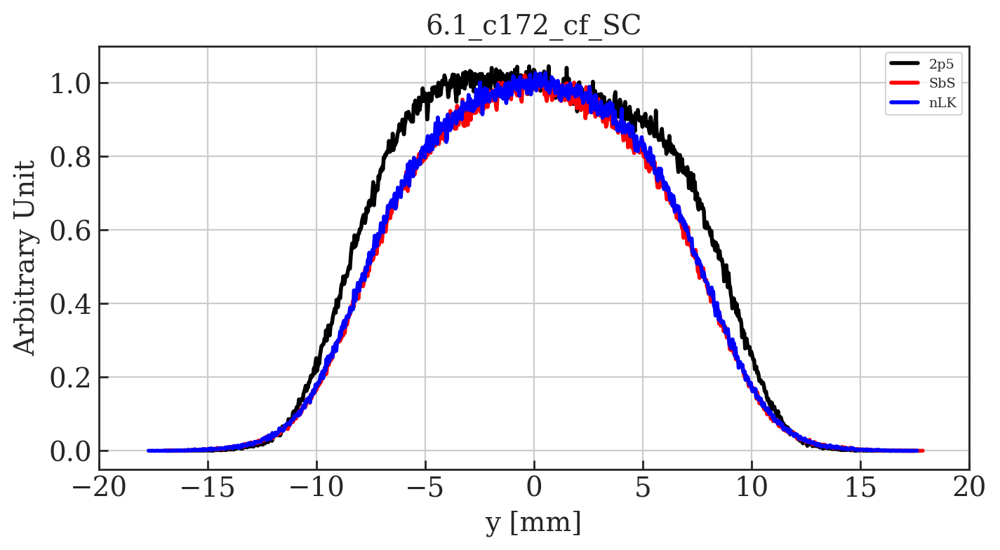

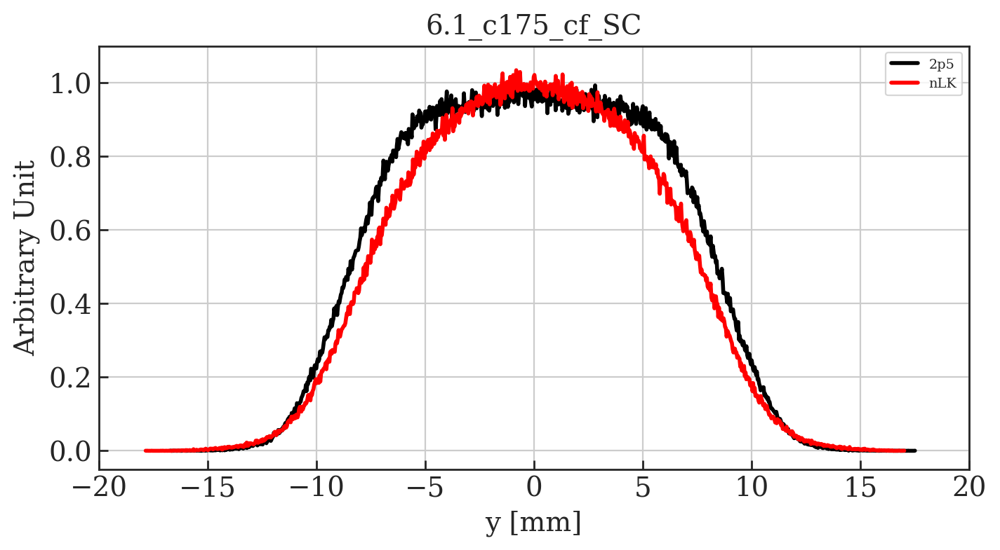

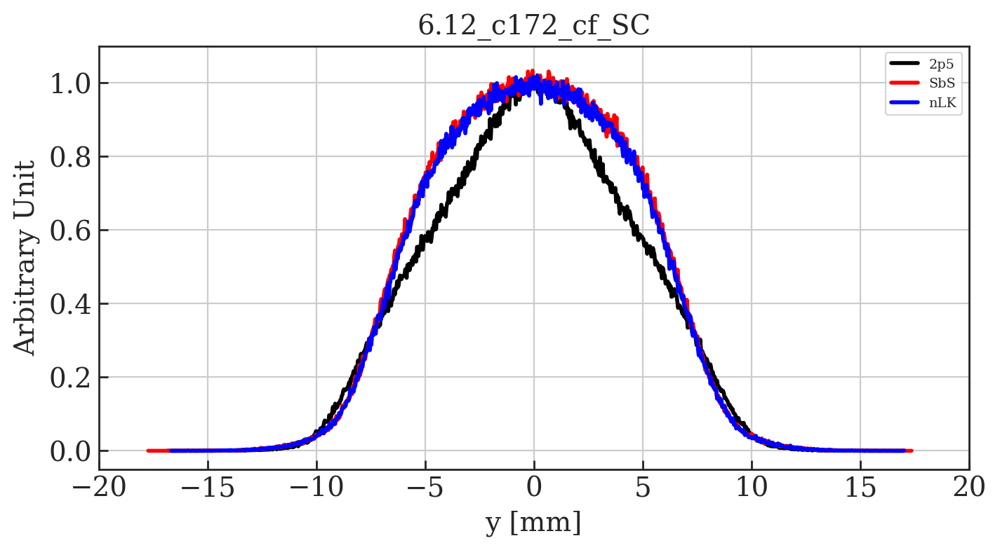

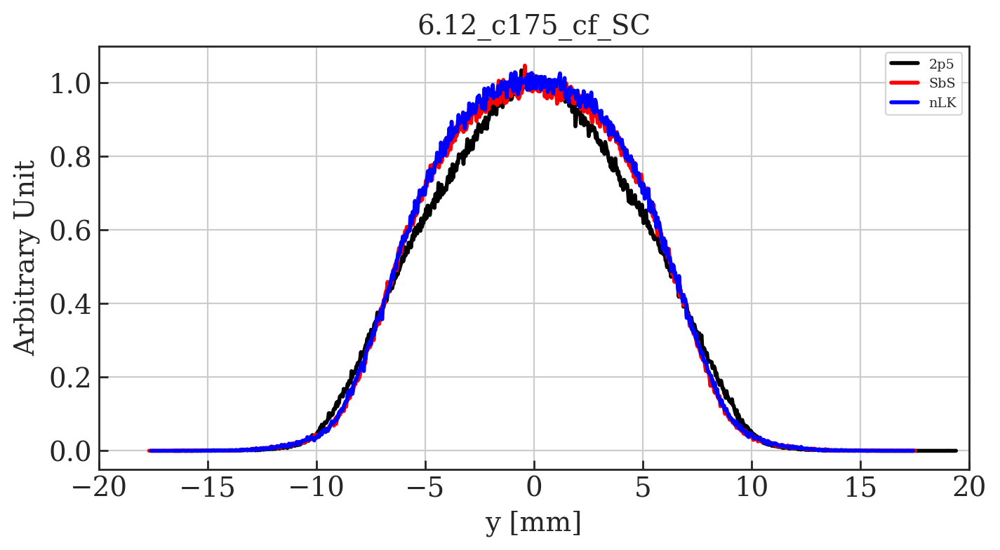

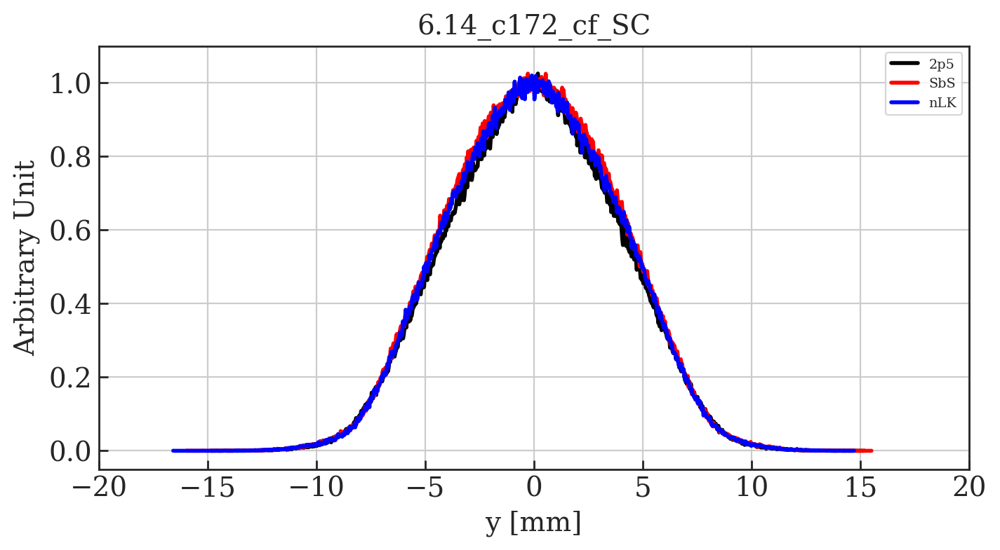

...

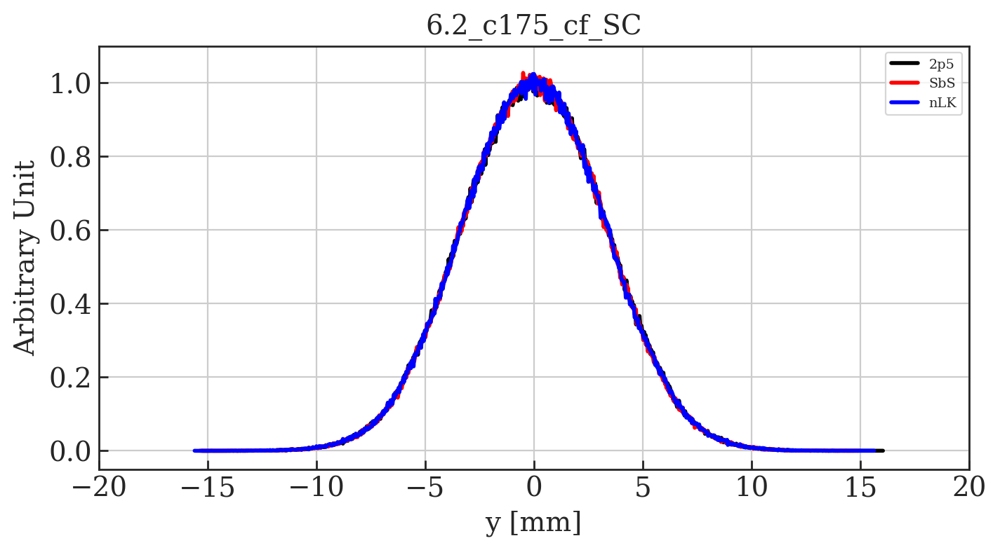

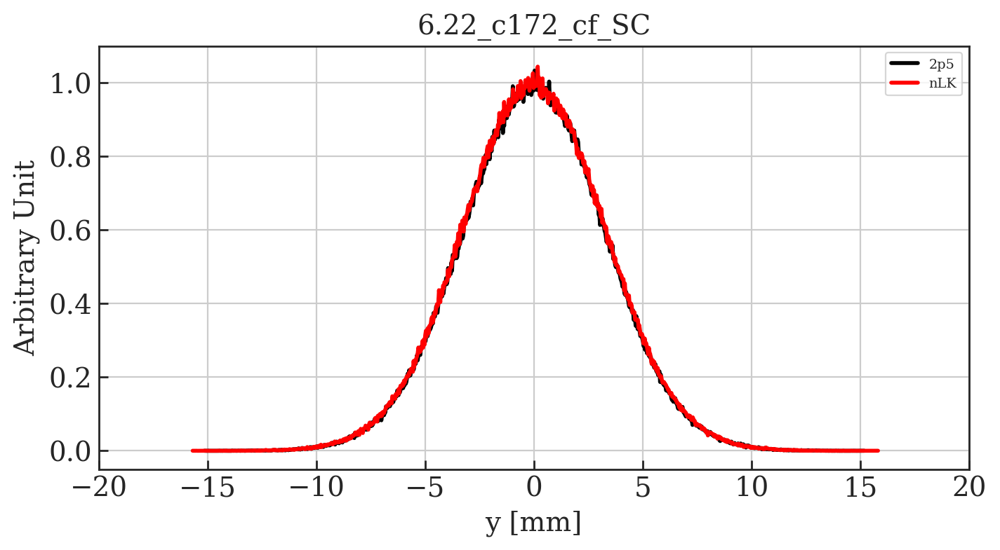

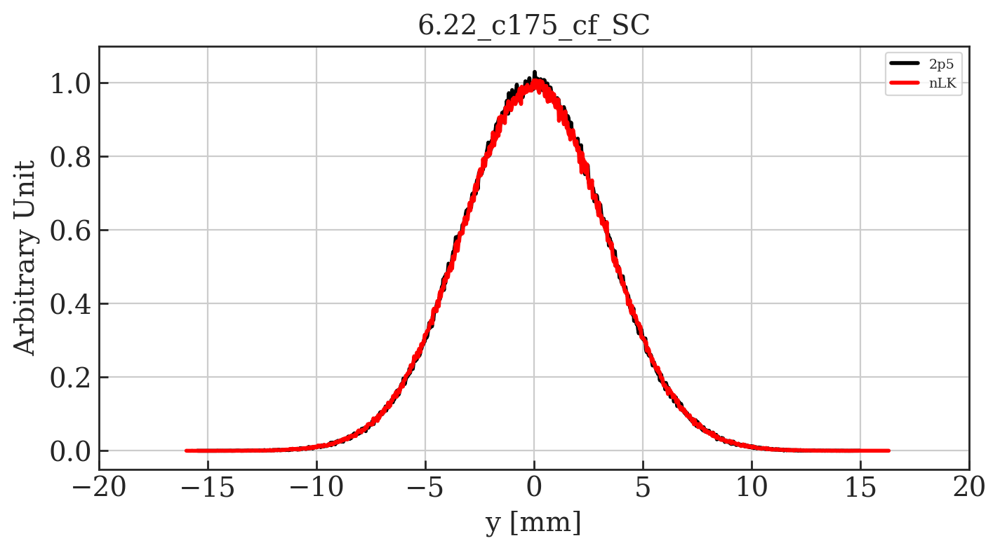

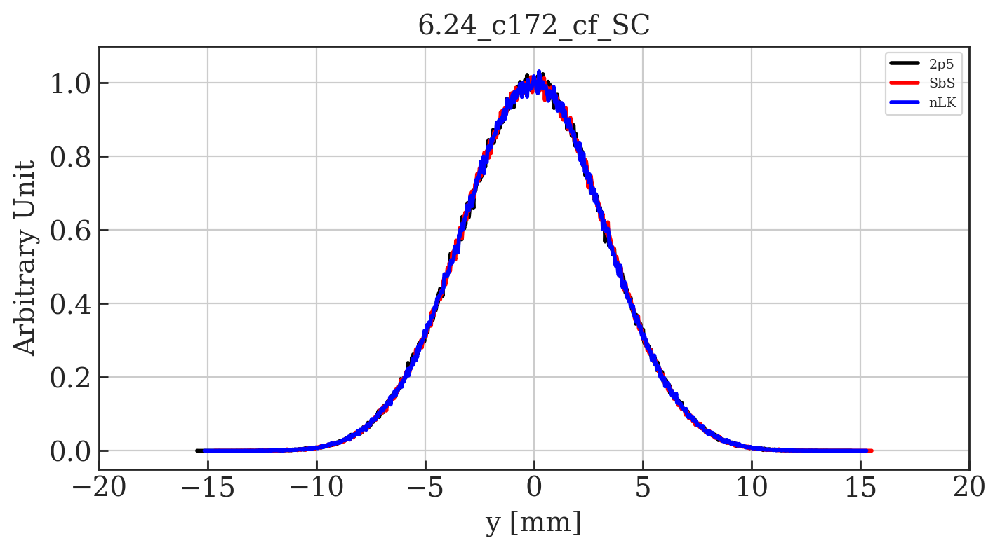

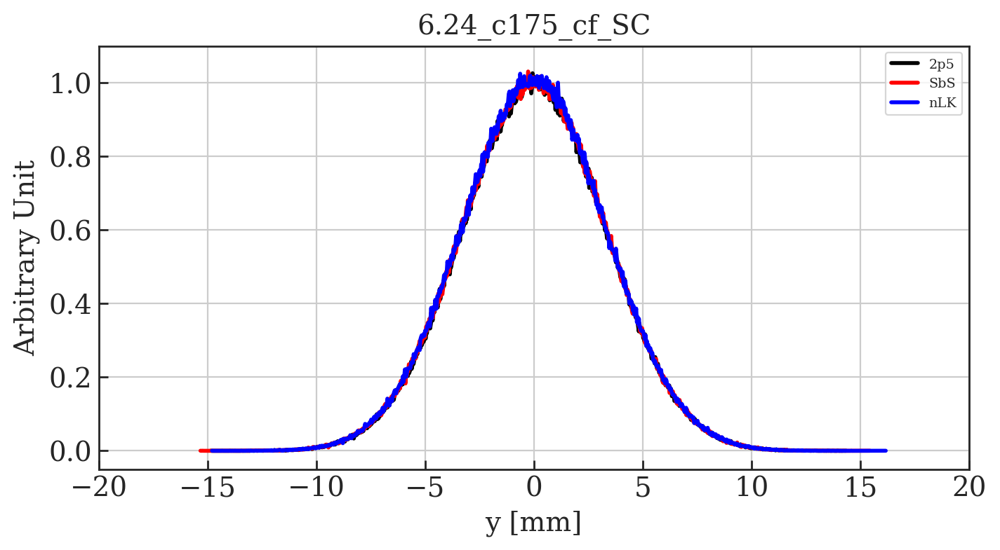

In [36]:
#Main function to plot comparison plots without MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label

        sim_labels=[label]
        
        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Compare Sims and MD data


Importing simulation file: 610_2p5_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  2p5
	MATCH FOUND
	Qy =  6.1 , ctime = 172.0 [ms]
	lab =  2p5 , lab1 = SbS
	MATCH FOUND
	Qy =  6.1 , ctime = 172.0 [ms]
	lab =  2p5 , lab1 = nLK
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.0620324890160946
	x_dat[index] =  0.6644736430204148
	index of x_dat =  0.6644736430204148  is  511
	Mean of peak point +/- 3 points =  0.059357650521392843

	MAX(y_dat) =  0.06881981869235444
	x_dat[index] =  -0.4349557309893157
	index of x_dat =  -0.4349557309893157  is  475
	Mean of peak point +/- 3 points =  0.06744222203627334

	MAX(y_dat) =  0.0682796384660435
	x_dat[index] =  0.06023263363791642
	index of x_dat =  0.06023263363791642  is  503
	Mean of peak point +/- 3 points =  0.0664914519889055

Importing simulation file: 610_2p5_c175
Qy =  6.1 , ctime = 175.0 [ms], label =  2p5
	MATCH FOUND
	Qy =  6.1 , ctime = 175.0 [ms]
	lab =  2p5 , lab1 = nLK
[28, 72, 114, 159, 201, 243, 286, 329, 371,


	MAX(y_dat) =  0.12282843531777879
	x_dat[index] =  0.016090629062309958
	index of x_dat =  0.016090629062309958  is  488
	Mean of peak point +/- 3 points =  0.12047365393568162

	MAX(y_dat) =  0.1239215625220683
	x_dat[index] =  -0.5065212192052684
	index of x_dat =  -0.5065212192052684  is  490
	Mean of peak point +/- 3 points =  0.12065600672662538

	MAX(y_dat) =  0.12340770745762977
	x_dat[index] =  -0.008734869892442987
	index of x_dat =  -0.008734869892442987  is  499
	Mean of peak point +/- 3 points =  0.12049532333732134

Importing simulation file: 622_2p5_c172
Qy =  6.22 , ctime = 172.0 [ms], label =  2p5
	MATCH FOUND
	Qy =  6.22 , ctime = 172.0 [ms]
	lab =  2p5 , lab1 = nLK
[2, 45, 132, 175, 217, 261, 303, 346, 387]

	MAX(y_dat) =  0.12799495380500345
	x_dat[index] =  0.020599165064243863
	index of x_dat =  0.020599165064243863  is  500
	Mean of peak point +/- 3 points =  0.1238636557592434

	MAX(y_dat) =  0.12766857993880312
	x_dat[index] =  0.16368371379296498
	index of x_

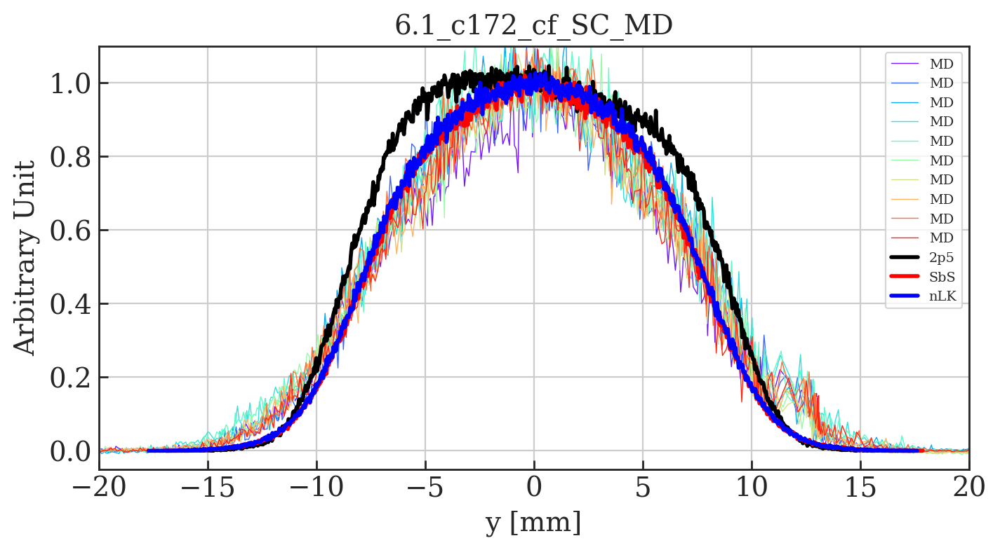

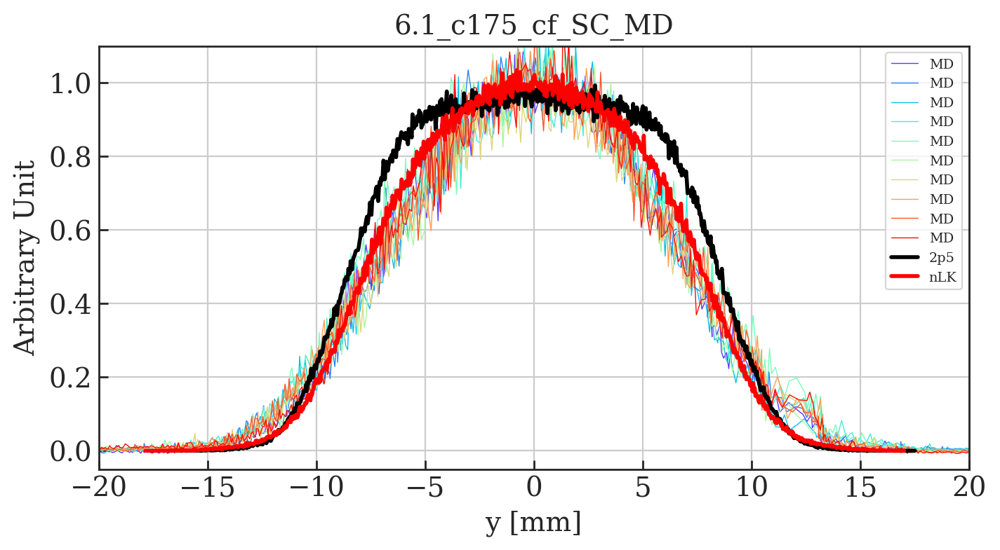

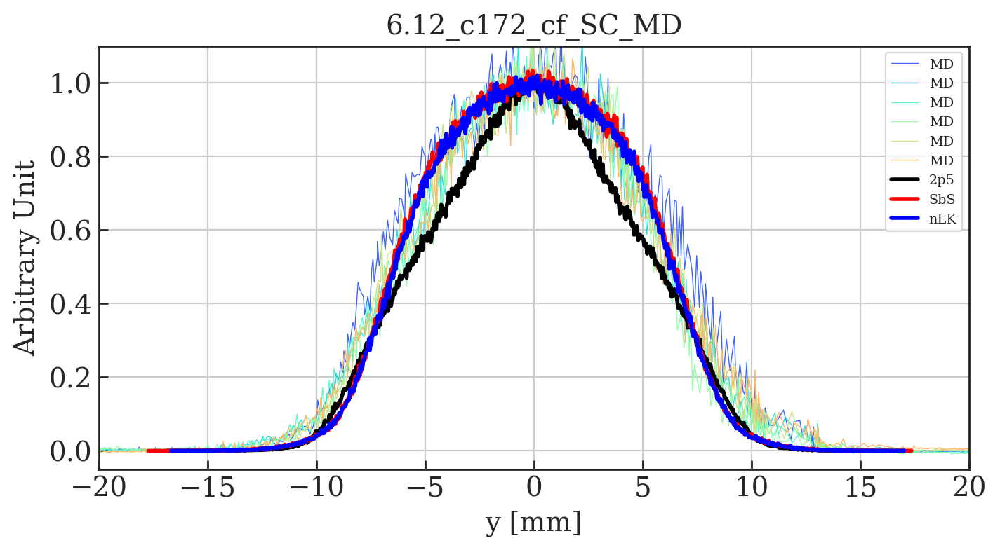

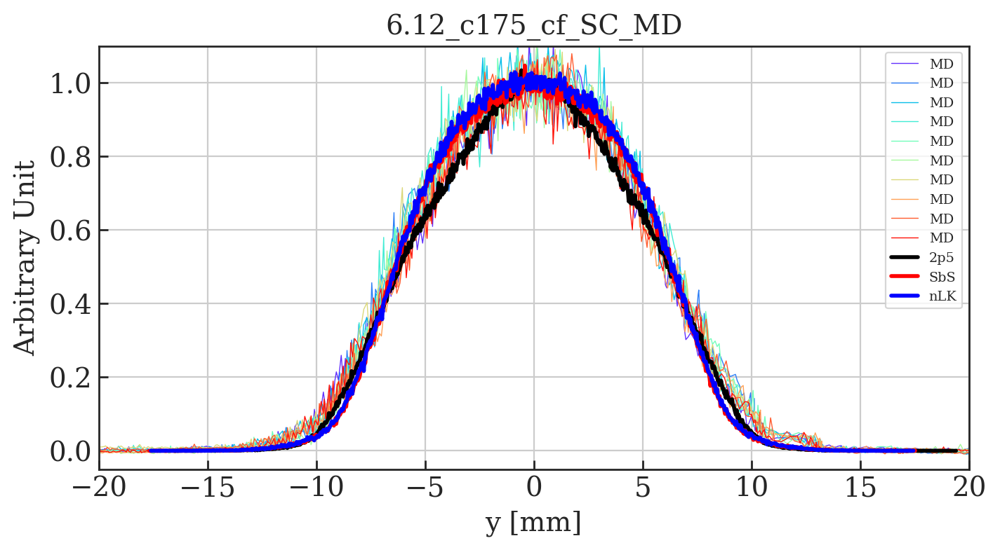

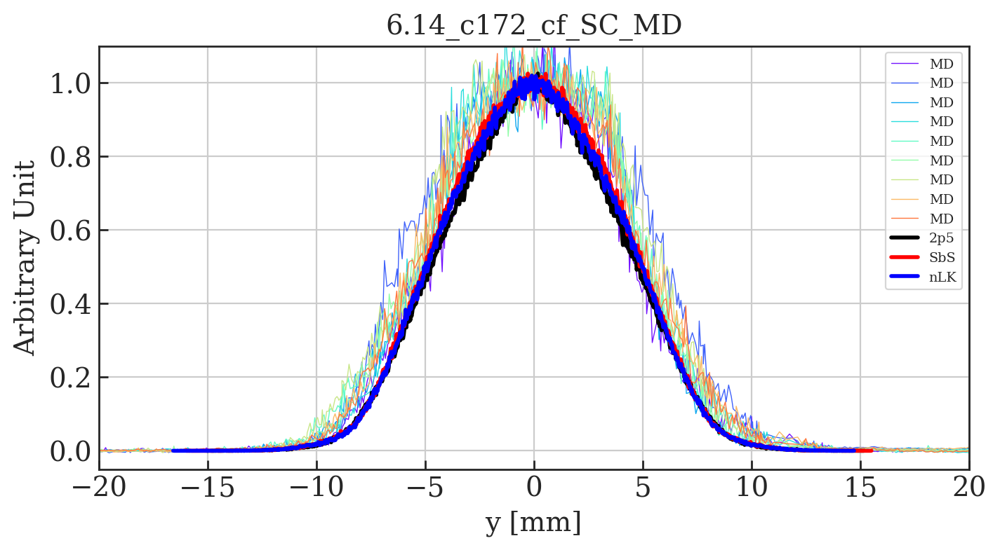

...

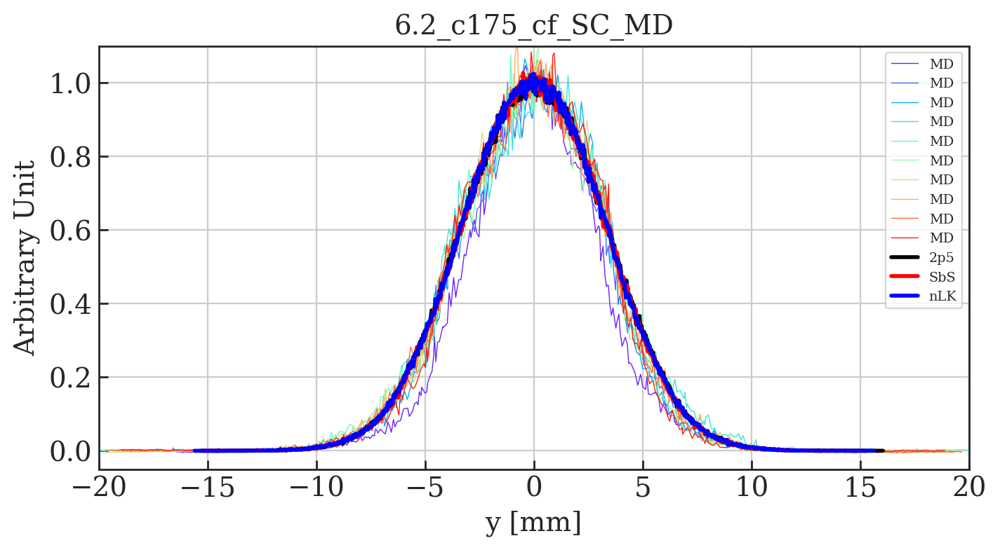

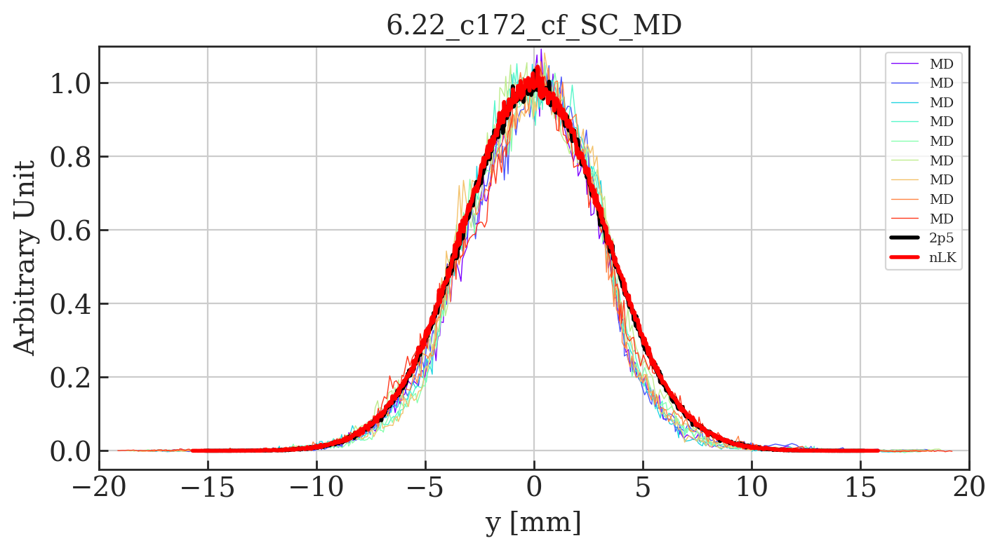

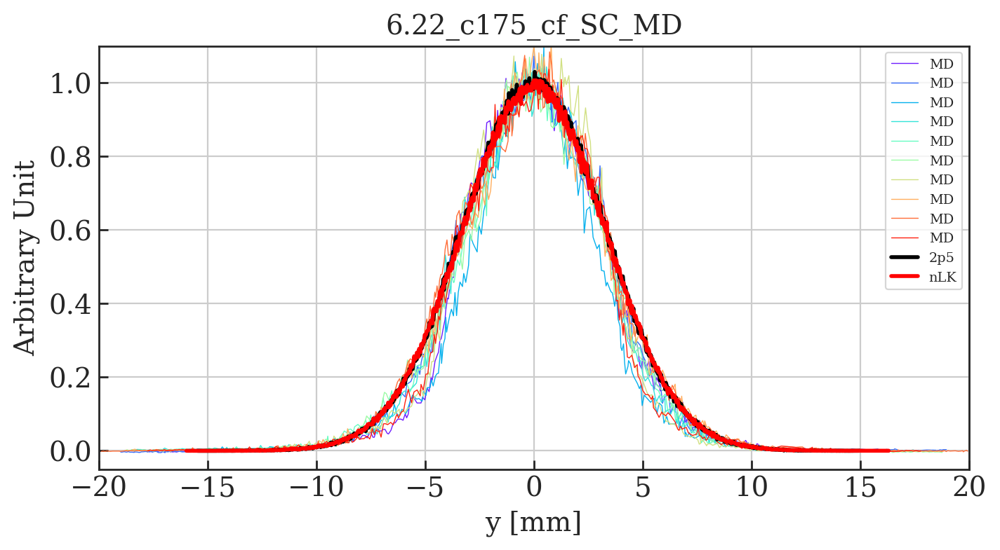

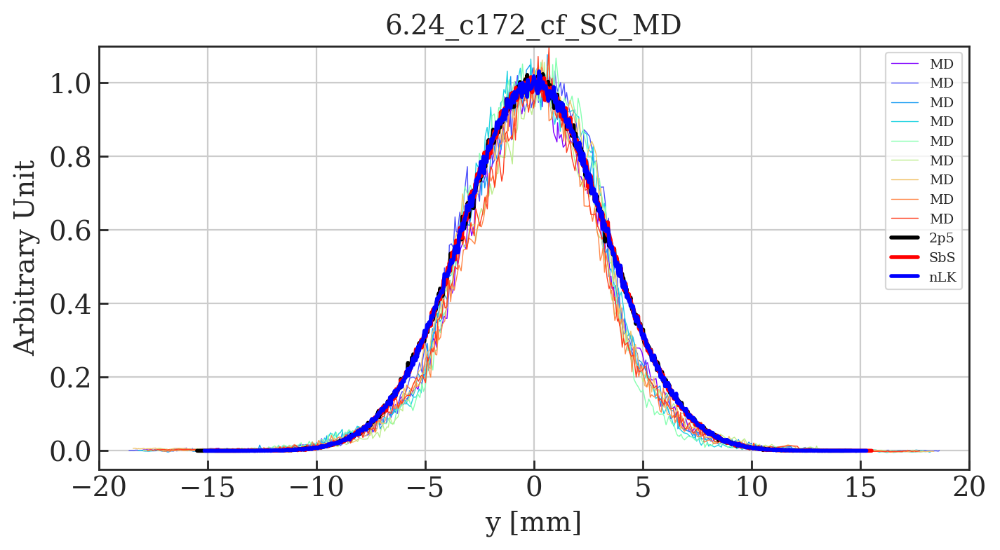

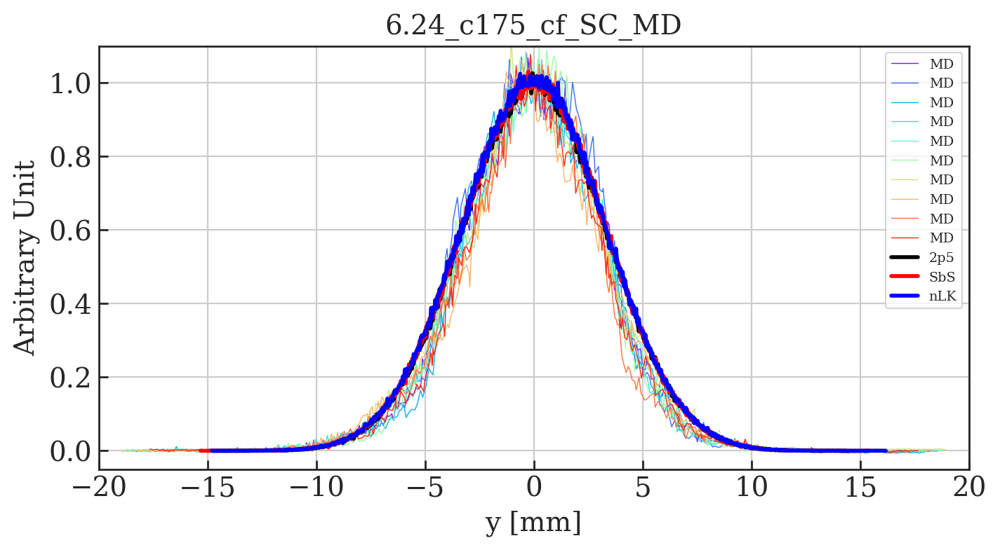

In [37]:
#Main function to plot comparison plots with MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label
        
        sim_labels=[label]

        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC_MD'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=True)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Test Plots

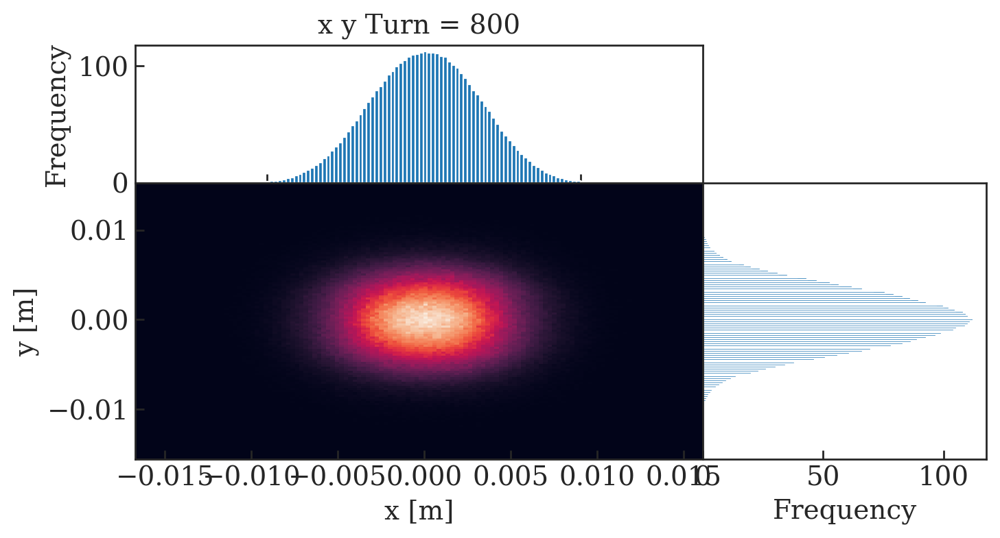

In [38]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
bin_size_x = 128
bin_size_y = 128
x_min = np.min(d['particles']['x'][0][0][0])
x_max = np.max(d['particles']['x'][0][0][0])
y_min = np.min(d['particles']['y'][0][0][0])
y_max = np.max(d['particles']['y'][0][0][0])


fig2 = plt.figure(1)
gridspec.GridSpec(3,3)  # Create grid to resize subplots
fig2.subplots_adjust(hspace = 0) # Horizontal spacing between subplots
fig2.subplots_adjust(wspace = 0) # Vertical spacing between subplots
tit1 = 'x y Turn = 800'

plt.subplot2grid((3,3), (0,0), colspan=2, rowspan=1)
plt.hist(d['particles']['x'][0][0][0], bins = bin_size_x,  range = [x_min, x_max], density=True)
plt.ylabel('Frequency')
plt.title(tit1)

plt.subplot2grid((3,3), (1,0), colspan=2, rowspan=2)
plt.hist2d(d['particles']['x'][0][0][0], d['particles']['y'][0][0][0], bin_size_x, range=[[x_min, x_max],[y_min, y_max]])
plt.xlabel('x [m]')
plt.ylabel('y [m]')

plt.subplot2grid((3,3), (1,2), colspan=1, rowspan=2)
plt.hist(d['particles']['y'][0][0][0], bins = bin_size_y,  range = [y_min, y_max], density=True, orientation=u'horizontal')
plt.xlabel('Frequency')
current_axis = plt.gca()
current_axis.axes.get_yaxis().set_visible(False)

figname = 'x_y.png'
fig2.savefig(figname);

In [ ]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
multi = 1/1E-3

bin_size_x = 128
bin_size_y = 128
x_min = np.min(d['particles']['x'][0][0][0])*multi
x_max = np.max(d['particles']['x'][0][0][0])*multi
y_min = np.min(d['particles']['y'][0][0][0])*multi
y_max = np.max(d['particles']['y'][0][0][0])*multi

plt.hist(d['particles']['x'][0][0][0]*multi, bins = bin_size_x,  range = [x_min, x_max], density=True)
plt.ylabel('Frequency')
plt.xlabel('x [mm]')


In [ ]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
multi = 1/1E-3

bin_size_x = 128
bin_size_y = 128
x_min = np.min(d['particles']['x'][0][0][0])*multi
x_max = np.max(d['particles']['x'][0][0][0])*multi
y_min = np.min(d['particles']['y'][0][0][0])*multi
y_max = np.max(d['particles']['y'][0][0][0])*multi

# plt.hist(d['particles']['y'][0][0][0]*multi, bins = bin_size_y,  range = [y_min, y_max], density=True)

data=np.array(d['particles']['y'][0][0][0]*multi)
y,binEdges=np.histogram(data, bins=1280, density=True)
bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

plt.plot(bincenters, y)

plt.ylabel('Density')
plt.xlabel('y [mm]')


In [ ]:
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

In [ ]:
# Make dictionary of nearest tune point and iterators
tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

In [ ]:
#Use maximums to 'normalise'
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
multi = 1/1E-3

bin_size_x = 128
bin_size_y = 128
x_min = np.min(d['particles']['x'][0][0][0])*multi
x_max = np.max(d['particles']['x'][0][0][0])*multi
y_min = np.min(d['particles']['y'][0][0][0])*multi
y_max = np.max(d['particles']['y'][0][0][0])*multi

plt.hist(d['particles']['y'][0][0][0]*multi, bins = bin_size_y,  range = [y_min, y_max], density=True)
plt.ylabel('Frequency')
plt.xlabel('y [mm]')

i = 13
multi2 = 0.07/0.32
milti2 = max(d['particles']['y'][0][0][0])/max(np.array(df0['profile V'].iloc[i]))
plt.plot(df0['position V'].iloc[i], np.array(df0['profile V'].iloc[i])*multi2, color=colors[i])


In [ ]:
file_in2 = '612_sbs_799.mat'
d2=dict()
sio.loadmat(file_in2, mdict=d2)

In [ ]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
multi = 1/1E-3

bin_size_x = 128
bin_size_y = 128
x_min = np.min(d2['particles']['x'][0][0][0])*multi
x_max = np.max(d2['particles']['x'][0][0][0])*multi
y_min = np.min(d2['particles']['y'][0][0][0])*multi
y_max = np.max(d2['particles']['y'][0][0][0])*multi

plt.hist(d2['particles']['y'][0][0][0]*multi, bins = bin_size_y,  range = [y_min, y_max], density=True)
plt.ylabel('Frequency')
plt.xlabel('y [mm]')

i = 26
plt.plot(df0['position V'].iloc[i], df0['profile V'].iloc[i], color=colors[i])


# Try to normalise profile

In [ ]:
# Numpy hist, plot bincenters
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
multi = 1/1E-3

bin_size_x = 128
bin_size_y = 128
x_min = np.min(d['particles']['x'][0][0][0])*multi
x_max = np.max(d['particles']['x'][0][0][0])*multi
y_min = np.min(d['particles']['y'][0][0][0])*multi
y_max = np.max(d['particles']['y'][0][0][0])*multi

# plt.hist(d['particles']['y'][0][0][0]*multi, bins = bin_size_y,  range = [y_min, y_max], density=True)

y,binEdges=np.histogram(d['particles']['y'][0][0][0]*multi, bins=128, density=True)
bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

plt.plot(bincenters, y)

plt.ylabel('Density')
plt.xlabel('y [mm]')

In [ ]:
# pyplot hist manually normalised
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
multi = 1/1E-3
plt.hist(d['particles']['y'][0][0][0]*multi, normed=1, bins=128, label='normed')

x, bins, p = plt.hist(d['particles']['y'][0][0][0]*multi, normed=1, bins=128, label='manual normalisation')
for item in p: item.set_height(item.get_height()/sum(x))
plt.legend()

In [ ]:
#Pyplot hist step
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

multi = 1/1E-3
n,x,_ = plt.hist(d['particles']['y'][0][0][0]*multi, density=True, bins = 128, histtype=u'step')
bin_centers = 0.5*(x[1:]+x[:-1])
#plt.plot(bin_centers,n) ## using bin_centers rather than edges

In [ ]:
# Normalise profile manually
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

i = 26 # 6.12 c172
y_dat = []
b_w = abs(df0['position V'].iloc[i][1] - df0['position V'].iloc[i][0])

#Iterate over data
for j in xrange(len(df0['profile V'].iloc[i])):
    y_dat.append( df0['profile V'].iloc[i][j] * b_w/ sum(df0['profile V'].iloc[i]))

plt.plot(df0['position V'].iloc[i], y_dat, color=colors[i])
# plt.plot(df0['position V'].iloc[i], df0['profile V'].iloc[i], color=colors[0])

x, bins, p = plt.hist(d['particles']['y'][0][0][0]*multi, normed=1, bins=128, label='manual normalisation')
bin_width = (x[1]-x[0])
for item in p: item.set_height(item.get_height()/sum(x))
plt.legend()

print bin_width, b_w
print sum(x), sum(df0['profile V'].iloc[i])


In [ ]:
#Use maximums to 'normalise'
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
multi = 1/1E-3

bin_size_x = 1000
bin_size_y = 1000
x_min = np.min(d['particles']['x'][0][0][0])*multi
x_max = np.max(d['particles']['x'][0][0][0])*multi
y_min = np.min(d['particles']['y'][0][0][0])*multi
y_max = np.max(d['particles']['y'][0][0][0])*multi


plt.hist(d['particles']['y'][0][0][0]*multi, bins = bin_size_y,  range = [y_min, y_max], density=True, histtype=u'step', lw=2, color='k')
plt.ylabel('Arbitrary Unit')
plt.xlabel('y [mm]')

i = 13
multi2 =1
#multi2 = 0.07/0.32
multi2 = max()/max(np.array(df0['profile V'].iloc[i]))
plt.plot(df0['position V'].iloc[i], np.array(df0['profile V'].iloc[i])*multi2, color=colors[i])
